#Kaggle Dataset Download

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!mkdir -p ~/.kaggle
!cp /content/drive/Shareddrives/DATA255_KaggleDatasets/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c data-255-class-competition-road-sign-detection -p /content/drive/Shareddrives/Lab1_KaggleDatasets

100% 267M/267M [00:14<00:00, 22.4MB/s]
100% 267M/267M [00:14<00:00, 19.6MB/s]


In [ ]:
!unzip /content/drive/Shareddrives/DATA255_KaggleDatasets/data-255-class-competition-road-sign-detection.zip -d /content/drive/Shareddrives/Lab1_KaggleDatasets

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels/00024_00003_00005_png_jpg.rf.a39ae3ca9a48fc27a32a64e89f7e2237.txt  
  inflating: /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels/00024_00003_00006_png_jpg.rf.032c9cb278d36f34bd52982bc9090fbb.txt  
  inflating: /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels/00024_00003_00006_png_jpg.rf.5369770dccc8f228a98ec82d3dec693d.txt  
  inflating: /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels/00024_00003_00006_png_jpg.rf.b36bed42b528d8696897d5bdb040bffe.txt  
  inflating: /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels/00024_00003_00007_png_jpg.rf.3a9839b02721a0efbf8bcbe7342d8722.txt  
  inflating: /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels/00024_00003_00007_png_jpg.r

#mount and base_path

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import yaml
import os

base_path = '/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3'

yaml_path = os.path.join(base_path, 'data.yaml')
with open(yaml_path, 'r') as file:
    config = yaml.safe_load(file)

config

{'train': '../train/images',
 'val': '../valid/images',
 'test': '../test/images',
 'nc': 25,
 'names': ['-Road narrows on right',
  'Attention Please-',
  'Beware of children',
  'CYCLE ROUTE AHEAD WARNING',
  'Crosswalk',
  'Dangerous Left Curve Ahead',
  'Dangerous Rright Curve Ahead',
  'No Entry',
  'No_Over_Taking',
  'One way road',
  'Speed bump ahead',
  'Speed limit',
  'Speed limit 100 Kph',
  'Speed limit 120 Kph',
  'Speed limit 20 Kph',
  'Speed limit 30 Kph',
  'Speed limit 40 Kph',
  'Speed limit 50 Kph',
  'Speed limit 60 Kph',
  'Speed limit 70 Kph',
  'Speed limit 80 Kph',
  'Speed limit 90 Kph',
  'Stop_Sign',
  'Uneven Road',
  'roundabout']}

## EDA

In [4]:
expected_num_classes = config['nc']
expected_class_names = config['names']

print(f"Expected number of classes: {expected_num_classes}")
print(f"Expected class names: {expected_class_names}")

if len(expected_class_names) == expected_num_classes:
    print("Number of classes matches the YAML config.")
else:
    print("Mismatch in the number of classes!")

Expected number of classes: 25
Expected class names: ['-Road narrows on right', 'Attention Please-', 'Beware of children', 'CYCLE ROUTE AHEAD WARNING', 'Crosswalk', 'Dangerous Left Curve Ahead', 'Dangerous Rright Curve Ahead', 'No Entry', 'No_Over_Taking', 'One way road', 'Speed bump ahead', 'Speed limit', 'Speed limit 100 Kph', 'Speed limit 120 Kph', 'Speed limit 20 Kph', 'Speed limit 30 Kph', 'Speed limit 40 Kph', 'Speed limit 50 Kph', 'Speed limit 60 Kph', 'Speed limit 70 Kph', 'Speed limit 80 Kph', 'Speed limit 90 Kph', 'Stop_Sign', 'Uneven Road', 'roundabout']
Number of classes matches the YAML config.


In [5]:
train_images_path = os.path.join(base_path, 'train', 'images')
train_labels_path = os.path.join(base_path, 'train', 'labels')
valid_images_path = os.path.join(base_path, 'valid', 'images')
valid_labels_path = os.path.join(base_path, 'valid', 'labels')
test_images_path = os.path.join(base_path, 'test')

In [6]:
def count_files(folder_path):
    return len([name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))])

print("Train Images:", count_files(train_images_path))
print("Train Labels:", count_files(train_labels_path))
print("Test Images:", count_files(test_images_path))
print("Valid Images:", count_files(valid_images_path))
print("Valid Labels:", count_files(valid_labels_path))

Train Images: 5325
Train Labels: 5325
Test Images: 308
Valid Images: 623
Valid Labels: 623


Random samples from Train images with class index:


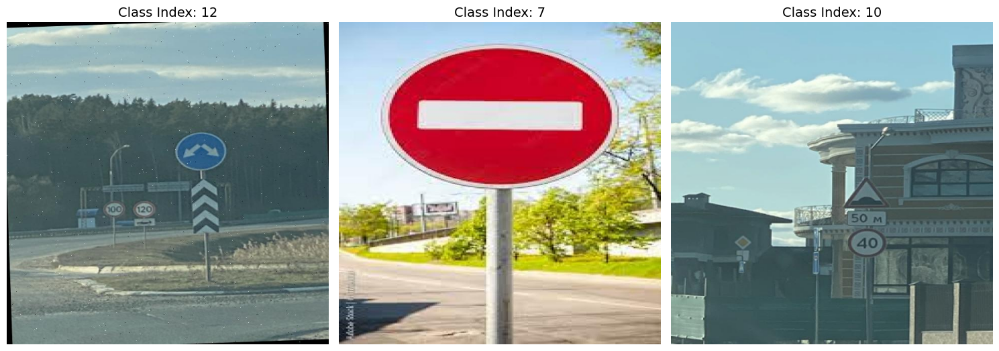

Random samples from Validation images with class index:


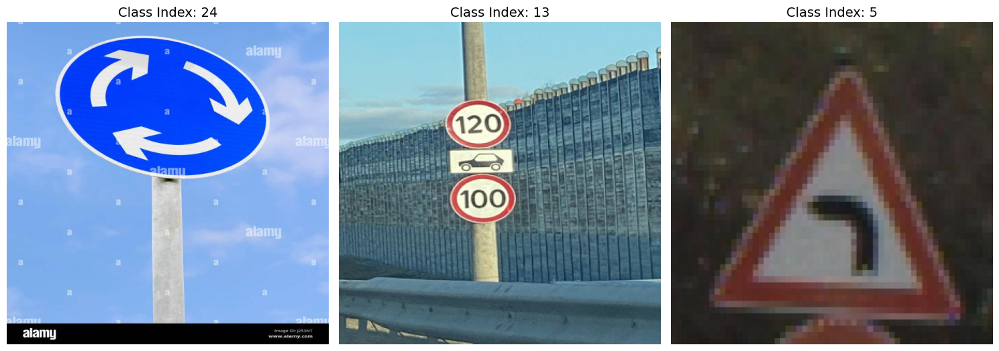

Random samples from Test images (no labels):


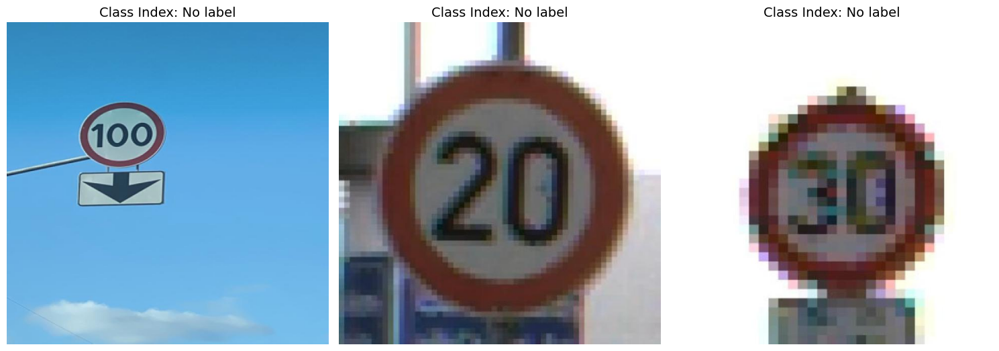

In [7]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Function to display random samples with only the class index
def display_random_samples_with_class_index(images_path, labels_path=None, num_samples=3):
    images = os.listdir(images_path)
    random_samples = random.sample(images, num_samples)

    plt.figure(figsize=(15, 10))
    for i, img_file in enumerate(random_samples, 1):
        img_path = os.path.join(images_path, img_file)
        img = mpimg.imread(img_path)

        # Get class index from label file if available
        if labels_path:
            label_file = img_file.replace('.jpg', '.txt').replace('.png', '.txt')
            label_path = os.path.join(labels_path, label_file)
            if os.path.exists(label_path):
                with open(label_path, 'r') as file:
                    # Read the label file and extract only the class index (the first number)
                    class_index = file.readline().split()[0]  # Extracts only the class index
            else:
                class_index = 'No label found'
        else:
            class_index = 'No label'

        plt.subplot(1, num_samples, i)
        plt.imshow(img)
        plt.title(f"Class Index: {class_index}", fontsize=14)  # Display only the class index
        plt.axis('off')  # Hide the axes for cleaner display
    plt.tight_layout()
    plt.show()

# Display random samples from train, validation, and test sets with only class index
print("Random samples from Train images with class index:")
display_random_samples_with_class_index(train_images_path, train_labels_path)

print("Random samples from Validation images with class index:")
display_random_samples_with_class_index(valid_images_path, valid_labels_path)

print("Random samples from Test images (no labels):")
display_random_samples_with_class_index(test_images_path)  # No labels for test set

In [8]:
# Create a dictionary mapping each class ID to its corresponding label name
class_id_to_name = {i: name for i, name in enumerate(expected_class_names)}

# Display the mapping
print("Class ID to Label Name Mapping:")
for class_id, label_name in class_id_to_name.items():
    print(f"{class_id}: {label_name}")

Class ID to Label Name Mapping:
0: -Road narrows on right
1: Attention Please-
2: Beware of children
3: CYCLE ROUTE AHEAD WARNING
4: Crosswalk
5: Dangerous Left Curve Ahead
6: Dangerous Rright Curve Ahead
7: No Entry
8: No_Over_Taking
9: One way road
10: Speed bump ahead
11: Speed limit
12: Speed limit 100 Kph
13: Speed limit 120 Kph
14: Speed limit 20 Kph
15: Speed limit 30 Kph
16: Speed limit 40 Kph
17: Speed limit 50 Kph
18: Speed limit 60 Kph
19: Speed limit 70 Kph
20: Speed limit 80 Kph
21: Speed limit 90 Kph
22: Stop_Sign
23: Uneven Road
24: roundabout


#installs

In [9]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.6/877.6 kB 27.2 MB/s eta 0:00:00


#Training

## YOLOv8s Default Parameters

In [10]:
from ultralytics import YOLO

# Load the YOLOv8 model with pretrained weights
model = YOLO('yolov8s.pt')  # 'yolov8s.pt' is the nano version, you can change to 'yolov8s.pt', 'yolov8m.pt', etc.

# Train the model on your dataset using the default parameters
results = model.train(
    data='/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/data.yaml',  # Path to your data.yaml file
    epochs=10,  # Number of training epochs
    batch=16,   # Default batch size
    imgsz=640,  # Image size
    name='yolov8_road_sign_default'  # Name for the experiment
)

# Display results
results

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 187MB/s]


Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8_road_sign_default, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt

100%|██████████| 755k/755k [00:00<00:00, 22.4MB/s]


Overriding model.yaml nc=80 with nc=25

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 105MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels.cache... 5325 images, 12 backgrounds, 0 corrupt: 100%|██████████| 5325/5325 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.20 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels.cache... 623 images, 1 backgrounds, 0 corrupt: 100%|██████████| 623/623 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8_road_sign_default/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000345, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8_road_sign_default
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      4.02G     0.8082      3.332      1.259         13        640: 100%|██████████| 333/333 [05:00<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.60it/s]


                   all        623        801      0.757      0.674      0.749      0.613

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      3.99G     0.6919      1.085      1.139         13        640: 100%|██████████| 333/333 [00:35<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.13it/s]

                   all        623        801      0.806      0.762      0.831      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      4.01G     0.6784      0.776      1.134         16        640: 100%|██████████| 333/333 [00:34<00:00,  9.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.07it/s]

                   all        623        801      0.838      0.841      0.897      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      4.01G     0.6563     0.6245      1.116         19        640: 100%|██████████| 333/333 [00:33<00:00,  9.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.05it/s]

                   all        623        801      0.868      0.868      0.916       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      4.15G     0.6412      0.532      1.094         16        640: 100%|██████████| 333/333 [00:33<00:00,  9.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.88it/s]

                   all        623        801      0.926      0.877      0.941      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      4.03G     0.6069     0.4471      1.073         18        640: 100%|██████████| 333/333 [00:33<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.76it/s]

                   all        623        801        0.9      0.905      0.947      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      4.01G     0.5829     0.4021       1.05         16        640: 100%|██████████| 333/333 [00:34<00:00,  9.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  6.57it/s]


                   all        623        801      0.935      0.901      0.953      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      4.01G     0.5599     0.3524      1.036         14        640: 100%|██████████| 333/333 [00:33<00:00,  9.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.99it/s]

                   all        623        801      0.935       0.93      0.962      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       4.3G     0.5388     0.3242      1.017         13        640: 100%|██████████| 333/333 [00:33<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.26it/s]

                   all        623        801      0.948      0.926      0.959      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      4.03G     0.5074     0.2918     0.9999         15        640: 100%|██████████| 333/333 [00:33<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.41it/s]

                   all        623        801      0.948      0.918      0.962      0.809



10 epochs completed in 0.183 hours.
Optimizer stripped from runs/detect/yolov8_road_sign_default/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/yolov8_road_sign_default/weights/best.pt, 22.5MB

Validating runs/detect/yolov8_road_sign_default/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,135,259 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.14it/s]


                   all        623        801      0.948      0.919      0.962      0.809
-Road narrows on right         15         15      0.904      0.933      0.985      0.869
     Attention Please-         23         23      0.973      0.957      0.993      0.879
    Beware of children         23         23      0.949      0.913      0.959      0.881
CYCLE ROUTE AHEAD WARNING         29         29          1      0.941      0.972      0.876
             Crosswalk         42         43      0.909      0.933      0.957      0.742
Dangerous Left Curve Ahead         24         24      0.861      0.792      0.857      0.726
Dangerous Rright Curve Ahead         30         30      0.917      0.833       0.94      0.818
              No Entry         26         27      0.949      0.963      0.974      0.875
        No_Over_Taking         23         23      0.982      0.957      0.989      0.718
          One way road         27         27      0.863      0.815       0.87      0.742
      Sp

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x799467f0f6d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,  

In [11]:
metrics = model.val()
# Inspecting the DetMetrics object
print(dir(metrics))  # This will show all available attributes and methods

Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,135,259 parameters, 0 gradients, 28.5 GFLOPs


val: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels.cache... 623 images, 1 backgrounds, 0 corrupt: 100%|██████████| 623/623 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:06<00:00,  5.67it/s]


                   all        623        801      0.948      0.919      0.962      0.809
-Road narrows on right         15         15      0.905      0.933      0.985      0.869
     Attention Please-         23         23      0.973      0.957      0.993      0.889
    Beware of children         23         23      0.949      0.913       0.96      0.882
CYCLE ROUTE AHEAD WARNING         29         29          1      0.941      0.972      0.876
             Crosswalk         42         43      0.909      0.933      0.957      0.747
Dangerous Left Curve Ahead         24         24      0.861      0.792      0.857      0.726
Dangerous Rright Curve Ahead         30         30      0.917      0.833      0.941      0.818
              No Entry         26         27      0.949      0.963      0.974      0.867
        No_Over_Taking         23         23      0.982      0.957      0.989      0.719
          One way road         27         27      0.863      0.815       0.87      0.742
      Sp

In [12]:
# IoU for each class at IoU threshold 50% (IoU@0.50)
class_ids = metrics.box.ap_class_index
iou_per_class = metrics.box.ap50

# Mapping class IDs to IoU values
class_iou_mapping = dict(zip(class_ids, iou_per_class))

# Output IoU per class
for class_id, iou in class_iou_mapping.items():
    print(f"Class ID: {class_id}, IoU@0.50: {iou}")


Class ID: 0, IoU@0.50: 0.9849999999999999
Class ID: 1, IoU@0.50: 0.9933333333333334
Class ID: 2, IoU@0.50: 0.9596121112929623
Class ID: 3, IoU@0.50: 0.972271641791045
Class ID: 4, IoU@0.50: 0.9566018376852986
Class ID: 5, IoU@0.50: 0.857438036312252
Class ID: 6, IoU@0.50: 0.9406549032553405
Class ID: 7, IoU@0.50: 0.9736458333333335
Class ID: 8, IoU@0.50: 0.989074074074074
Class ID: 9, IoU@0.50: 0.870238868905728
Class ID: 10, IoU@0.50: 0.995
Class ID: 11, IoU@0.50: 0.897266553480475
Class ID: 12, IoU@0.50: 0.9932051282051284
Class ID: 13, IoU@0.50: 0.9767241379310345
Class ID: 14, IoU@0.50: 0.9481125317748113
Class ID: 15, IoU@0.50: 0.9572495299430354
Class ID: 16, IoU@0.50: 0.9786652254007752
Class ID: 17, IoU@0.50: 0.9686626086956523
Class ID: 18, IoU@0.50: 0.9843725490196079
Class ID: 19, IoU@0.50: 0.9667142857142857
Class ID: 20, IoU@0.50: 0.9928156028368794
Class ID: 21, IoU@0.50: 0.9649868112626734
Class ID: 22, IoU@0.50: 0.9456351485148516
Class ID: 23, IoU@0.50: 0.9807904761904

In [13]:
# Create a submission file with best predictions
predictions = model.predict(source='/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test')  # Run predictions

# Create submission file ensuring no duplicates
with open('submission_1.csv', 'w') as f:
    f.write('filename,class\n')  # CSV header

    for pred in predictions:
        image_id = pred.path.split('/')[-1]  # Extract image ID from the path

        if pred.boxes is not None and len(pred.boxes) > 0:  # Check if there are any predicted boxes
            best_box = None  # Placeholder for best box (highest confidence)
            best_confidence = -1  # Initialize with a low value

            # Loop through each prediction box to find the best (highest confidence) box
            for box in pred.boxes.data:
                confidence = box[4].item()  # Confidence score (usually stored in index 4)

                if confidence > best_confidence:
                    best_confidence = confidence
                    best_box = box

            # After identifying the best box, write its class to the submission file
            if best_box is not None:
                class_id = int(best_box[5].item())  # Class ID (usually stored in index 5)
                class_name = pred.names[class_id]  # Get class name from 'names' dictionary
                f.write(f"{image_id},{class_name}\n")

        else:
            # If no boxes were detected for this image, write a default 'No detection'
            f.write(f"{image_id},No detection\n")


image 1/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00000_png_jpg.rf.fe38518f555b8b4d139ed0a31adee9fc.jpg: 640x640 2 No_Over_Takings, 7.7ms
image 2/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00014_png_jpg.rf.da4d304ccb4fd7555f5c291bed572107.jpg: 640x640 1 Speed limit 20 Kph, 7.6ms
image 3/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00018_png_jpg.rf.4eff8cf87317fad6622f1d00b81d575e.jpg: 640x640 1 Speed limit 20 Kph, 7.7ms
image 4/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00019_png_jpg.rf.923c0a404dce9e2518dcff1a64cd7e04.jpg: 640x640 1 Speed limit 20 Kph, 8.0ms
image 5/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00021_png_jpg.rf.f0f74c580fb71be6df258535e2d301af.jpg: 640x640 1 Speed limit 20 Kph, 9.1ms
image 6/308 /content/drive/Shareddrives/Lab1_Ka

In [15]:
import os
from ultralytics import YOLO
from pathlib import Path
import glob

# Load your trained model
model = YOLO('/content/runs/detect/yolov8s_road_sign_default/weights/best.pt')

# Specify the source of the validation images and labels
source_path = '/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test'
ground_truth_path = '/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels'

# Specify the directory where you want to save the predictions
save_directory = '/content/runs/detect/predictions_labels_test'  # Folder for saving labels
os.makedirs(save_directory, exist_ok=True)  # Create the directory if it doesn't exist

# Predict and get the results
predictions = model.predict(source=source_path, save=True)

# Function to calculate IoU
def calculate_iou(box1, box2):
    """Calculates IoU for two bounding boxes in (x1, y1, x2, y2) format."""
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Compute the area of intersection
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)

    # Compute the area of both the prediction and ground-truth rectangles
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the union area
    union_area = box1_area + box2_area - inter_area

    # Compute IoU
    iou = inter_area / union_area if union_area > 0 else 0
    return iou

def convert_yolo_to_xyxy(bbox, img_width, img_height):
    """Converts YOLO format (x_center, y_center, width, height) to (x1, y1, x2, y2)."""
    x_center, y_center, width, height = bbox
    x1 = (x_center - width / 2) * img_width
    y1 = (y_center - height / 2) * img_height
    x2 = (x_center + width / 2) * img_width
    y2 = (y_center + height / 2) * img_height
    return [x1, y1, x2, y2]

def load_ground_truth(ground_truth_path, image_name_base, img_width, img_height):
    """Loads ground truth bounding boxes from YOLO format and converts them to (x1, y1, x2, y2)."""
    gt_boxes = []

    # Match ground truth file using only the base part of the image name
    gt_pattern = os.path.join(ground_truth_path, f"{image_name_base}*.txt")
    matching_files = glob.glob(gt_pattern)

    if len(matching_files) == 0:
        print(f"No ground truth file found for {image_name_base}")
        return gt_boxes  # Return empty if no matching file is found

    gt_file = matching_files[0]  # Take the first match

    # Load ground truth boxes from the file
    with open(gt_file, 'r') as f:
        for line in f.readlines():
            label_data = line.split()
            bbox = [float(x) for x in label_data[1:5]]  # Assuming format: class x_center y_center width height
            gt_boxes.append(convert_yolo_to_xyxy(bbox, img_width, img_height))  # Convert to x1, y1, x2, y2

    return gt_boxes

# List to store IoU values
iou_list = []

# Save predictions and calculate IoU
for i, pred in enumerate(predictions):
    image_name = os.path.basename(pred.path)  # Get the image name
    label_file = os.path.join(save_directory, f"{image_name.split('.')[0]}.txt")  # Label file path

    pred_boxes = []  # To store predicted boxes for IoU calculation

    with open(label_file, 'w') as f:
        # Loop through each prediction box and save the label in YOLO format
        if pred.boxes is not None and len(pred.boxes) > 0:
            for box in pred.boxes.data:
                class_id = int(box[5].item())  # Class ID (usually stored in index 5)
                x_center = (box[0] + box[2]) / 2  # x_center (YOLO format)
                y_center = (box[1] + box[3]) / 2  # y_center (YOLO format)
                width = box[2] - box[0]  # width (YOLO format)
                height = box[3] - box[1]  # height (YOLO format)
                confidence = box[4].item()  # Confidence score

                # Store the predicted box in (x1, y1, x2, y2) format for IoU calculation
                pred_boxes.append([box[0].item(), box[1].item(), box[2].item(), box[3].item()])

                # Write the YOLO format label to the file (class_id x_center y_center width height confidence)
                f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f} {confidence:.6f}\n")
        else:
            f.write(f"No detections for {image_name}\n")


    image_name_base = image_name.split('.')[0]  # Extract base part of the image name
    gt_boxes = load_ground_truth(ground_truth_path, image_name_base, 640, 640)  # Pass all required arguments

    # Calculate IoU for each predicted box against the ground truth boxes
    if pred_boxes and gt_boxes:
        for pred_box in pred_boxes:
            best_iou = 0  # To store the best IoU for each predicted box
            for gt_box in gt_boxes:
                iou = calculate_iou(pred_box, gt_box)  # Compare only the box coordinates (x1, y1, x2, y2)
                if iou > best_iou:
                    best_iou = iou  # Store the best IoU for this predicted box
            print(f"IoU for {image_name}: {best_iou:.4f}")
            iou_list.append(best_iou)  # Append IoU to the list
    else:
        print(f"No predictions or ground truths available for {image_name}")

# Calculate and print the average IoU
if iou_list:
    avg_iou = sum(iou_list) / len(iou_list)
    print(f"Average IoU: {avg_iou:.4f}")
else:
    print("No IoU values calculated.")

print(f"Labels saved in {save_directory}")


image 1/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00000_png_jpg.rf.fe38518f555b8b4d139ed0a31adee9fc.jpg: 640x640 2 No_Over_Takings, 7.6ms
image 2/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00014_png_jpg.rf.da4d304ccb4fd7555f5c291bed572107.jpg: 640x640 1 Speed limit 20 Kph, 14.0ms
image 3/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00018_png_jpg.rf.4eff8cf87317fad6622f1d00b81d575e.jpg: 640x640 1 Speed limit 20 Kph, 7.7ms
image 4/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00019_png_jpg.rf.923c0a404dce9e2518dcff1a64cd7e04.jpg: 640x640 1 Speed limit 20 Kph, 15.8ms
image 5/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00021_png_jpg.rf.f0f74c580fb71be6df258535e2d301af.jpg: 640x640 1 Speed limit 20 Kph, 8.8ms
image 6/308 /content/drive/Shareddrives/Lab1_

Random samples from inferred images:


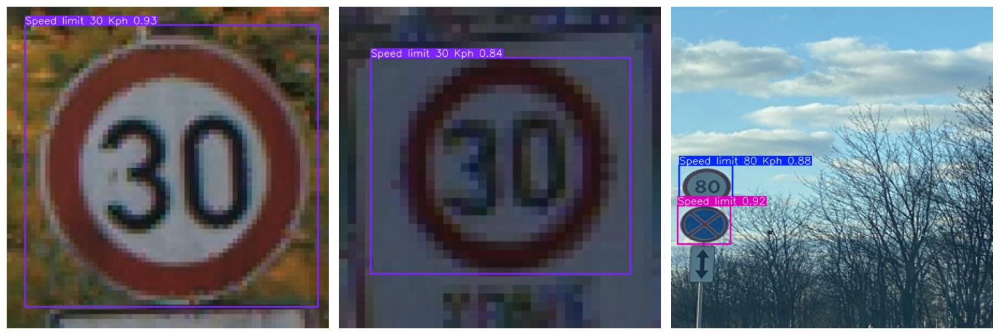

In [40]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Function to display random samples with only the class index
def display_random_samples_with_class_index(images_path, num_samples=3):
    images = os.listdir(images_path)
    random_samples = random.sample(images, num_samples)

    plt.figure(figsize=(15, 10))
    for i, img_file in enumerate(random_samples, 1):
        img_path = os.path.join(images_path, img_file)
        img = mpimg.imread(img_path)
        plt.subplot(1, num_samples, i)
        plt.imshow(img)
        plt.axis('off')  # Hide the axes for cleaner display
    plt.tight_layout()
    plt.show()

# Display random samples from predictions on test dataset:
print("Random samples from inferred images:")
display_random_samples_with_class_index('/content/runs/detect/predict_default')

In [25]:
from IPython.display import display, Image

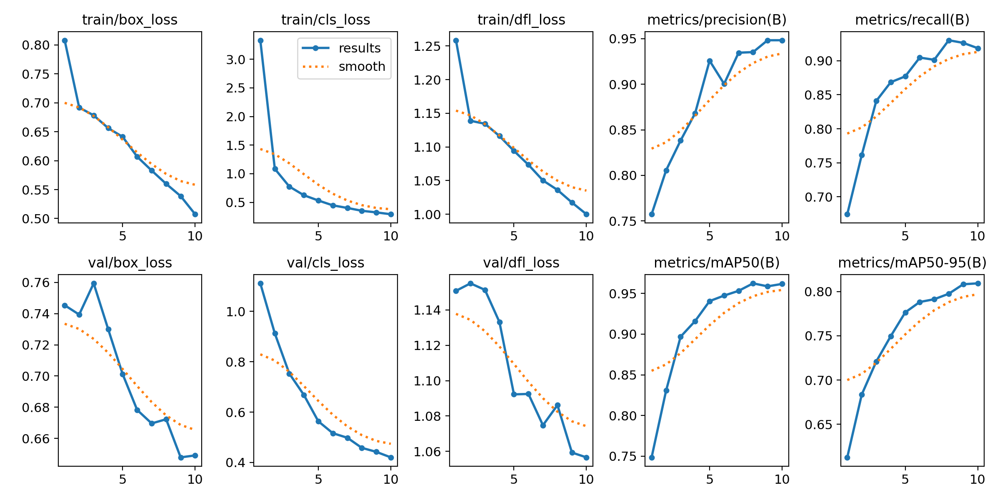

In [29]:
Image(filename='/content/runs/detect/yolov8s_road_sign_default/results.png', width=1000)

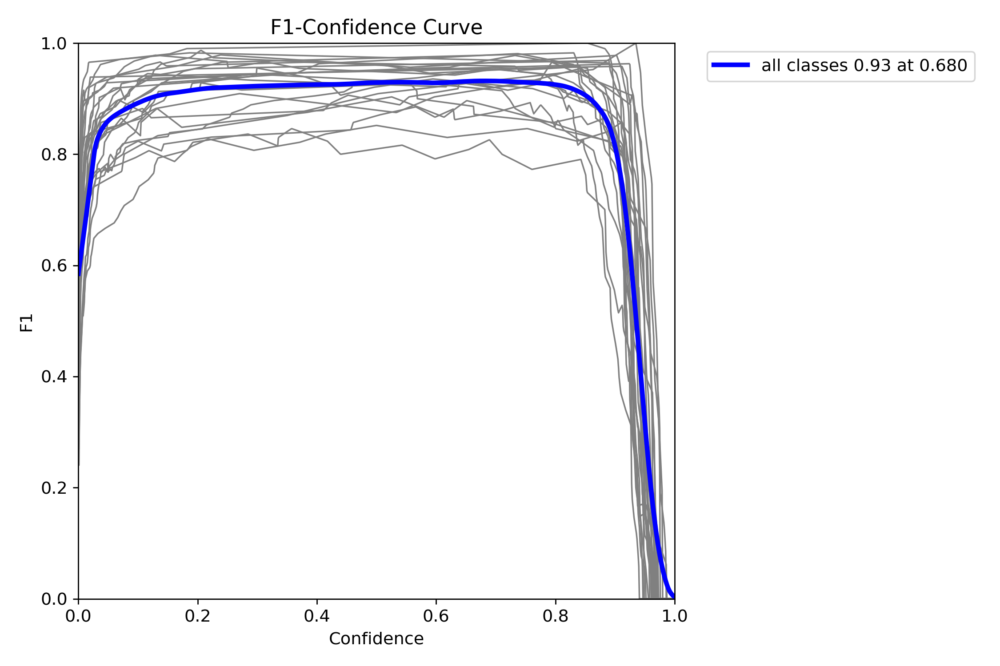

In [30]:
Image(filename='/content/runs/detect/yolov8s_road_sign_default/F1_curve.png', width=1000)

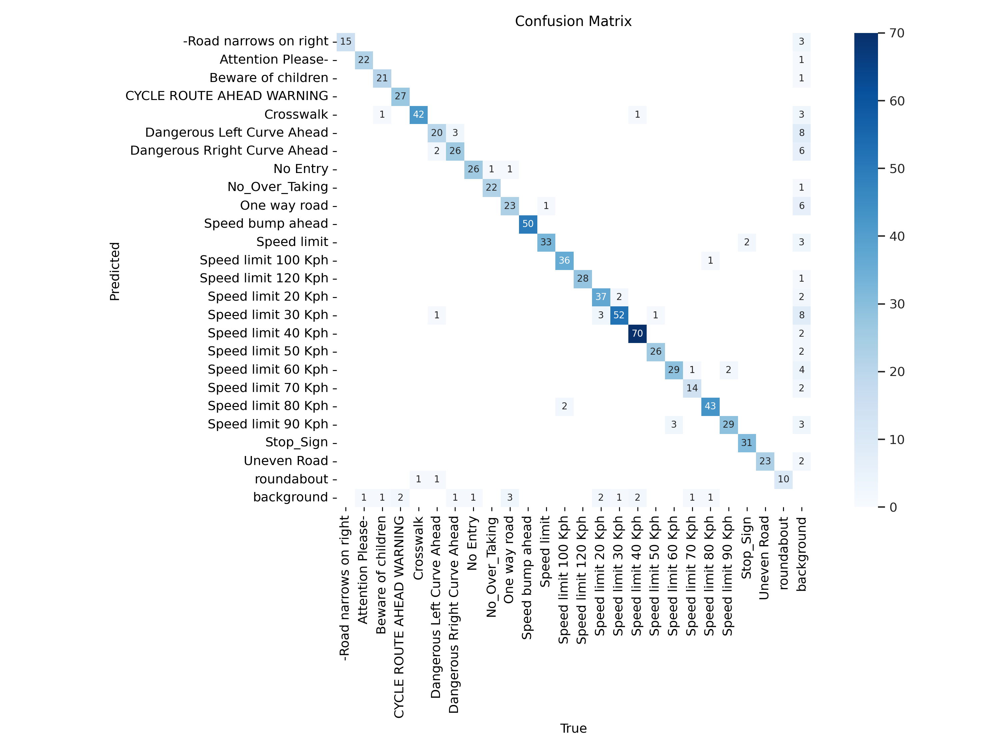

In [31]:
Image(filename='/content/runs/detect/yolov8s_road_sign_default/confusion_matrix.png', width=1000)

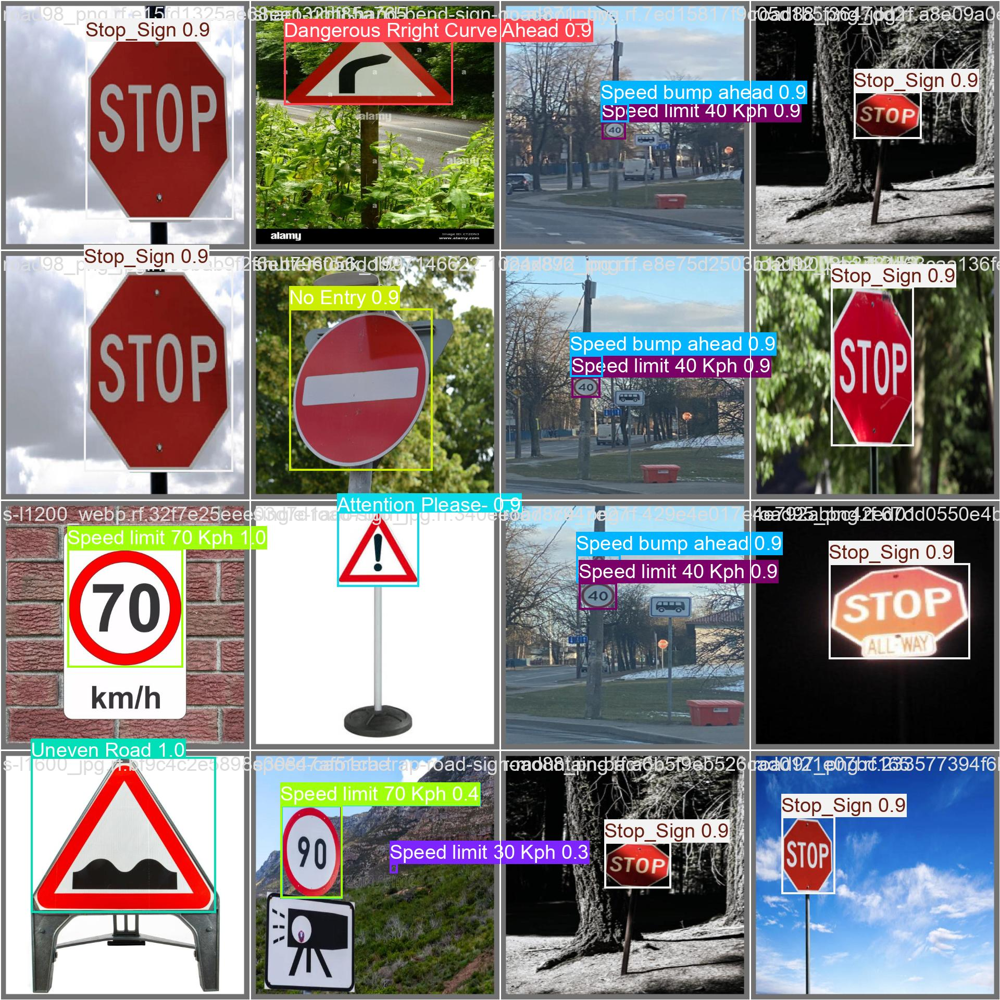

In [37]:
Image(filename='/content/runs/detect/yolov8s_road_sign_default/val_batch0_pred.jpg', width=1000)

In [38]:
import shutil
from google.colab import files

# Zip the entire 'runs' folder
shutil.make_archive('runs_backup_8s_default', 'zip', 'runs')

# Download the zipped file
files.download('runs_backup_8s_default.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## YOLOv8
finetuning

In [42]:
from ultralytics import YOLO

# Load the YOLOv8s model
model = YOLO('yolov8s.pt')

# Train the model with experimental parameters
results = model.train(
    data='/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/data.yaml',  # Path to your data.yaml file
    epochs=100,  # Increased epochs for more training time
    batch=16,  # Experiment with batch size (reduce if you face memory issues)
    imgsz=640,  # Keeping image size the same
    lr0=0.001,  # Try a smaller or larger learning rate, experiment between 0.0001 to 0.01
    weight_decay=0.0001,  # Lower weight decay for regularization
    optimizer='Adam',  # Switching optimizer to Adam
    augment=True,  # Enable augmentations for robustness
    patience=7,  # Early stopping to prevent overtraining
    mosaic=1.0,  # Mosaic augmentation probability, helps in training
    mixup=0.1,  # MixUp augmentation, another useful augmentation strategy
    warmup_epochs=3,  # Warmup phase to stabilize training at the start
    warmup_momentum=0.9,  # Control for momentum during warmup
    warmup_bias_lr=0.05,  # Warmup learning rate for bias
    name='yolov8s_road_sign_experiment'  # Experiment name
)

# Display results
results

Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/data.yaml, epochs=100, time=None, patience=7, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8s_road_sign_experiment, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_t

train: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels.cache... 5325 images, 12 backgrounds, 0 corrupt: 100%|██████████| 5325/5325 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels.cache... 623 images, 1 backgrounds, 0 corrupt: 100%|██████████| 623/623 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8s_road_sign_experiment/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0001), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8s_road_sign_experiment
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.75G     0.9349      2.091      1.311         34        640: 100%|██████████| 333/333 [00:44<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.03it/s]

                   all        623        801      0.558      0.643       0.65      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.32G     0.8961      1.425      1.271         30        640: 100%|██████████| 333/333 [00:37<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  6.51it/s]

                   all        623        801      0.666      0.655      0.723      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.03G     0.8957      1.304       1.27         34        640: 100%|██████████| 333/333 [00:36<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  6.55it/s]

                   all        623        801      0.752      0.683      0.774      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.06G     0.8688      1.184      1.246         33        640: 100%|██████████| 333/333 [00:36<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.10it/s]

                   all        623        801      0.746      0.797      0.834      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.32G     0.8237      1.063      1.214         29        640: 100%|██████████| 333/333 [00:36<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.73it/s]

                   all        623        801      0.853       0.81      0.878      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.04G     0.8078      1.002      1.207         33        640: 100%|██████████| 333/333 [00:35<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  6.52it/s]

                   all        623        801      0.812      0.865      0.887      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.02G     0.7915     0.9512      1.195         36        640: 100%|██████████| 333/333 [00:36<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.15it/s]

                   all        623        801      0.865      0.839      0.906      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.05G     0.7781     0.8923      1.182         37        640: 100%|██████████| 333/333 [00:36<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  6.36it/s]

                   all        623        801      0.879      0.826      0.914      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.32G     0.7727     0.8665      1.177         37        640: 100%|██████████| 333/333 [00:36<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.71it/s]

                   all        623        801      0.868      0.883      0.919      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.04G     0.7596     0.8298      1.169         28        640: 100%|██████████| 333/333 [00:36<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.16it/s]

                   all        623        801      0.919      0.877      0.946      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.02G     0.7569     0.8049      1.167         44        640: 100%|██████████| 333/333 [00:36<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.84it/s]


                   all        623        801      0.928      0.874      0.941      0.772

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.03G     0.7498     0.7804      1.163         43        640: 100%|██████████| 333/333 [00:35<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.83it/s]

                   all        623        801      0.882      0.898      0.937      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.32G     0.7286     0.7639      1.149         41        640: 100%|██████████| 333/333 [00:35<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.22it/s]


                   all        623        801       0.89       0.89      0.937      0.766

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.04G      0.734     0.7617      1.149         43        640: 100%|██████████| 333/333 [00:36<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.83it/s]

                   all        623        801       0.91      0.898      0.941      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.04G     0.7229     0.7324      1.142         39        640: 100%|██████████| 333/333 [00:36<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.84it/s]

                   all        623        801      0.893      0.897      0.946      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.04G     0.7198     0.7123      1.137         38        640: 100%|██████████| 333/333 [00:36<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  7.09it/s]

                   all        623        801      0.923      0.914      0.948      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.32G     0.7085     0.7001      1.133         31        640: 100%|██████████| 333/333 [00:36<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:02<00:00,  6.85it/s]

                   all        623        801      0.912      0.929      0.953      0.772
EarlyStopping: Training stopped early as no improvement observed in last 7 epochs. Best results observed at epoch 10, best model saved as best.pt.
To update EarlyStopping(patience=7) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



17 epochs completed in 0.193 hours.
Optimizer stripped from runs/detect/yolov8s_road_sign_experiment/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/yolov8s_road_sign_experiment/weights/best.pt, 22.5MB

Validating runs/detect/yolov8s_road_sign_experiment/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,135,259 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.99it/s]


                   all        623        801      0.904      0.881      0.941      0.773
-Road narrows on right         15         15       0.96        0.8      0.942      0.819
     Attention Please-         23         23      0.986          1      0.995       0.87
    Beware of children         23         23      0.975      0.826      0.912      0.801
CYCLE ROUTE AHEAD WARNING         29         29      0.912      0.931      0.976      0.863
             Crosswalk         42         43       0.89      0.942      0.945      0.692
Dangerous Left Curve Ahead         24         24      0.618      0.808      0.726      0.605
Dangerous Rright Curve Ahead         30         30      0.645      0.833      0.822      0.685
              No Entry         26         27      0.974          1      0.995      0.868
        No_Over_Taking         23         23      0.957      0.964      0.993      0.672
          One way road         27         27      0.964      0.815       0.91      0.762
      Sp

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7992094bd180>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,  

In [43]:
metrics = model.val()

Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,135,259 parameters, 0 gradients, 28.5 GFLOPs


val: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels.cache... 623 images, 1 backgrounds, 0 corrupt: 100%|██████████| 623/623 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:07<00:00,  5.39it/s]


                   all        623        801      0.904      0.881      0.941      0.773
-Road narrows on right         15         15       0.96        0.8      0.942      0.819
     Attention Please-         23         23      0.986          1      0.995      0.871
    Beware of children         23         23      0.975      0.826      0.912      0.804
CYCLE ROUTE AHEAD WARNING         29         29      0.912      0.931      0.976      0.863
             Crosswalk         42         43       0.89      0.943      0.943      0.694
Dangerous Left Curve Ahead         24         24      0.618      0.809      0.724      0.603
Dangerous Rright Curve Ahead         30         30      0.643      0.833      0.822      0.685
              No Entry         26         27      0.974          1      0.995      0.873
        No_Over_Taking         23         23      0.957      0.964      0.993      0.672
          One way road         27         27      0.964      0.815       0.91      0.769
      Sp

In [44]:
# IoU for each class at IoU threshold 50% (IoU@0.50)
class_ids = metrics.box.ap_class_index
iou_per_class = metrics.box.ap50

# Mapping class IDs to IoU values
class_iou_mapping2 = dict(zip(class_ids, iou_per_class))

# Output IoU per class
for class_id, iou in class_iou_mapping2.items():
    print(f"Class ID: {class_id}, IoU@0.50: {iou}")

Class ID: 0, IoU@0.50: 0.9418609986504722
Class ID: 1, IoU@0.50: 0.995
Class ID: 2, IoU@0.50: 0.9122963525835868
Class ID: 3, IoU@0.50: 0.9759957627118643
Class ID: 4, IoU@0.50: 0.9434967104506745
Class ID: 5, IoU@0.50: 0.7235724608151652
Class ID: 6, IoU@0.50: 0.8220632824135984
Class ID: 7, IoU@0.50: 0.995
Class ID: 8, IoU@0.50: 0.9933333333333334
Class ID: 9, IoU@0.50: 0.909885383470462
Class ID: 10, IoU@0.50: 0.9946078431372548
Class ID: 11, IoU@0.50: 0.905893737433771
Class ID: 12, IoU@0.50: 0.9814505493602621
Class ID: 13, IoU@0.50: 0.9882773109243699
Class ID: 14, IoU@0.50: 0.9235301109104109
Class ID: 15, IoU@0.50: 0.930814939795573
Class ID: 16, IoU@0.50: 0.9817933199732801
Class ID: 17, IoU@0.50: 0.9150397332846181
Class ID: 18, IoU@0.50: 0.892650234962123
Class ID: 19, IoU@0.50: 0.995
Class ID: 20, IoU@0.50: 0.9643218514683378
Class ID: 21, IoU@0.50: 0.9310213191826097
Class ID: 22, IoU@0.50: 0.9404886646884273
Class ID: 23, IoU@0.50: 0.9711403508771931
Class ID: 24, IoU@0.5

In [45]:
# Create a submission file with best predictions
predictions = model.predict(source='/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test')  # Run predictions

# Create submission file ensuring no duplicates
with open('submission_2.csv', 'w') as f:
    f.write('filename,class\n')  # CSV header

    for pred in predictions:
        image_id = pred.path.split('/')[-1]  # Extract image ID from the path

        if pred.boxes is not None and len(pred.boxes) > 0:  # Check if there are any predicted boxes
            best_box = None  # Placeholder for best box (highest confidence)
            best_confidence = -1  # Initialize with a low value

            # Loop through each prediction box to find the best (highest confidence) box
            for box in pred.boxes.data:
                confidence = box[4].item()  # Confidence score (usually stored in index 4)

                if confidence > best_confidence:
                    best_confidence = confidence
                    best_box = box

            # After identifying the best box, write its class to the submission file
            if best_box is not None:
                class_id = int(best_box[5].item())  # Class ID (usually stored in index 5)
                class_name = pred.names[class_id]  # Get class name from 'names' dictionary
                f.write(f"{image_id},{class_name}\n")

        else:
            # If no boxes were detected for this image, write a default 'No detection'
            f.write(f"{image_id},No detection\n")


image 1/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00000_png_jpg.rf.fe38518f555b8b4d139ed0a31adee9fc.jpg: 640x640 1 No_Over_Taking, 112.4ms
image 2/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00014_png_jpg.rf.da4d304ccb4fd7555f5c291bed572107.jpg: 640x640 1 Dangerous Left Curve Ahead, 1 Speed limit 20 Kph, 28.0ms
image 3/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00018_png_jpg.rf.4eff8cf87317fad6622f1d00b81d575e.jpg: 640x640 1 Speed bump ahead, 1 Speed limit 20 Kph, 27.2ms
image 4/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00019_png_jpg.rf.923c0a404dce9e2518dcff1a64cd7e04.jpg: 640x640 1 Speed limit 20 Kph, 33.8ms
image 5/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00021_png_jpg.rf.f0f74c580fb71be6df258535e2d301af.jpg: 640x640 1 Speed limit 20 Kph,

In [46]:
import os
from ultralytics import YOLO
from pathlib import Path
import glob

# Load your trained model
model = YOLO('/content/runs/detect/yolov8s_road_sign_experiment/weights/best.pt')

# Specify the source of the validation images and labels
source_path = '/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test'
ground_truth_path = '/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels'

# Specify the directory where you want to save the predictions
save_directory = '/content/runs/detect/predictions_finetune1_labels_test'  # Folder for saving labels
os.makedirs(save_directory, exist_ok=True)  # Create the directory if it doesn't exist

# Predict and get the results
predictions = model.predict(source=source_path, save=True)

# Function to calculate IoU
def calculate_iou(box1, box2):
    """Calculates IoU for two bounding boxes in (x1, y1, x2, y2) format."""
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Compute the area of intersection
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)

    # Compute the area of both the prediction and ground-truth rectangles
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the union area
    union_area = box1_area + box2_area - inter_area

    # Compute IoU
    iou = inter_area / union_area if union_area > 0 else 0
    return iou

def convert_yolo_to_xyxy(bbox, img_width, img_height):
    """Converts YOLO format (x_center, y_center, width, height) to (x1, y1, x2, y2)."""
    x_center, y_center, width, height = bbox
    x1 = (x_center - width / 2) * img_width
    y1 = (y_center - height / 2) * img_height
    x2 = (x_center + width / 2) * img_width
    y2 = (y_center + height / 2) * img_height
    return [x1, y1, x2, y2]

def load_ground_truth(ground_truth_path, image_name_base, img_width, img_height):
    """Loads ground truth bounding boxes from YOLO format and converts them to (x1, y1, x2, y2)."""
    gt_boxes = []

    # Match ground truth file using only the base part of the image name
    gt_pattern = os.path.join(ground_truth_path, f"{image_name_base}*.txt")
    matching_files = glob.glob(gt_pattern)

    if len(matching_files) == 0:
        print(f"No ground truth file found for {image_name_base}")
        return gt_boxes  # Return empty if no matching file is found

    gt_file = matching_files[0]  # Take the first match

    # Load ground truth boxes from the file
    with open(gt_file, 'r') as f:
        for line in f.readlines():
            label_data = line.split()
            bbox = [float(x) for x in label_data[1:5]]  # Assuming format: class x_center y_center width height
            gt_boxes.append(convert_yolo_to_xyxy(bbox, img_width, img_height))  # Convert to x1, y1, x2, y2

    return gt_boxes

# List to store IoU values
iou_list = []

# Save predictions and calculate IoU
for i, pred in enumerate(predictions):
    image_name = os.path.basename(pred.path)  # Get the image name
    label_file = os.path.join(save_directory, f"{image_name.split('.')[0]}.txt")  # Label file path

    pred_boxes = []  # To store predicted boxes for IoU calculation

    with open(label_file, 'w') as f:
        # Loop through each prediction box and save the label in YOLO format
        if pred.boxes is not None and len(pred.boxes) > 0:
            for box in pred.boxes.data:
                class_id = int(box[5].item())  # Class ID (usually stored in index 5)
                x_center = (box[0] + box[2]) / 2  # x_center (YOLO format)
                y_center = (box[1] + box[3]) / 2  # y_center (YOLO format)
                width = box[2] - box[0]  # width (YOLO format)
                height = box[3] - box[1]  # height (YOLO format)
                confidence = box[4].item()  # Confidence score

                # Store the predicted box in (x1, y1, x2, y2) format for IoU calculation
                pred_boxes.append([box[0].item(), box[1].item(), box[2].item(), box[3].item()])

                # Write the YOLO format label to the file (class_id x_center y_center width height confidence)
                f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f} {confidence:.6f}\n")
        else:
            f.write(f"No detections for {image_name}\n")


    image_name_base = image_name.split('.')[0]  # Extract base part of the image name
    gt_boxes = load_ground_truth(ground_truth_path, image_name_base, 640, 640)  # Pass all required arguments

    # Calculate IoU for each predicted box against the ground truth boxes
    if pred_boxes and gt_boxes:
        for pred_box in pred_boxes:
            best_iou = 0  # To store the best IoU for each predicted box
            for gt_box in gt_boxes:
                iou = calculate_iou(pred_box, gt_box)  # Compare only the box coordinates (x1, y1, x2, y2)
                if iou > best_iou:
                    best_iou = iou  # Store the best IoU for this predicted box
            print(f"IoU for {image_name}: {best_iou:.4f}")
            iou_list.append(best_iou)  # Append IoU to the list
    else:
        print(f"No predictions or ground truths available for {image_name}")

# Calculate and print the average IoU
if iou_list:
    avg_iou = sum(iou_list) / len(iou_list)
    print(f"Average IoU: {avg_iou:.4f}")
else:
    print("No IoU values calculated.")

print(f"Labels saved in {save_directory}")


image 1/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00000_png_jpg.rf.fe38518f555b8b4d139ed0a31adee9fc.jpg: 640x640 1 No_Over_Taking, 8.2ms
image 2/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00014_png_jpg.rf.da4d304ccb4fd7555f5c291bed572107.jpg: 640x640 1 Dangerous Rright Curve Ahead, 1 Speed limit 20 Kph, 7.9ms
image 3/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00018_png_jpg.rf.4eff8cf87317fad6622f1d00b81d575e.jpg: 640x640 1 Speed limit 20 Kph, 8.2ms
image 4/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00019_png_jpg.rf.923c0a404dce9e2518dcff1a64cd7e04.jpg: 640x640 1 Speed limit 20 Kph, 12.0ms
image 5/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00021_png_jpg.rf.f0f74c580fb71be6df258535e2d301af.jpg: 640x640 1 Speed limit 20 Kph, 10.6ms
image 6/308 /c

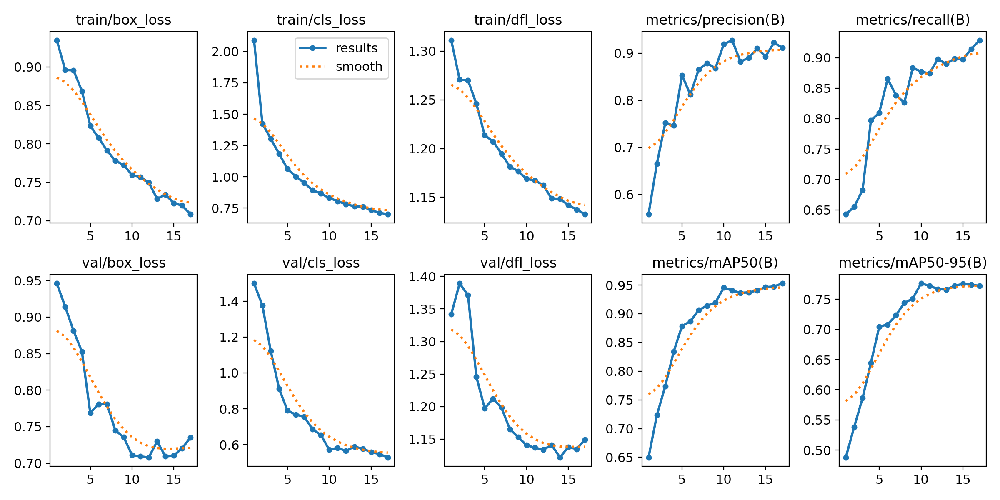

In [47]:
Image(filename='/content/runs/detect/yolov8s_road_sign_experiment/results.png', width=1000)

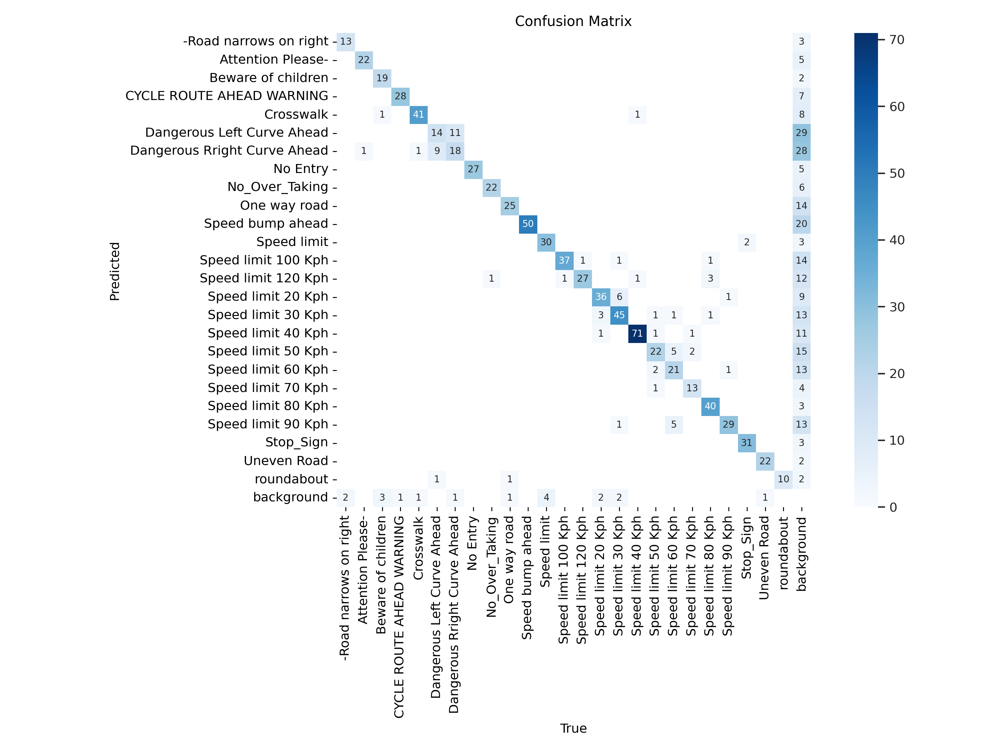

In [48]:
Image(filename='/content/runs/detect/yolov8s_road_sign_experiment/confusion_matrix.png', width=1000)

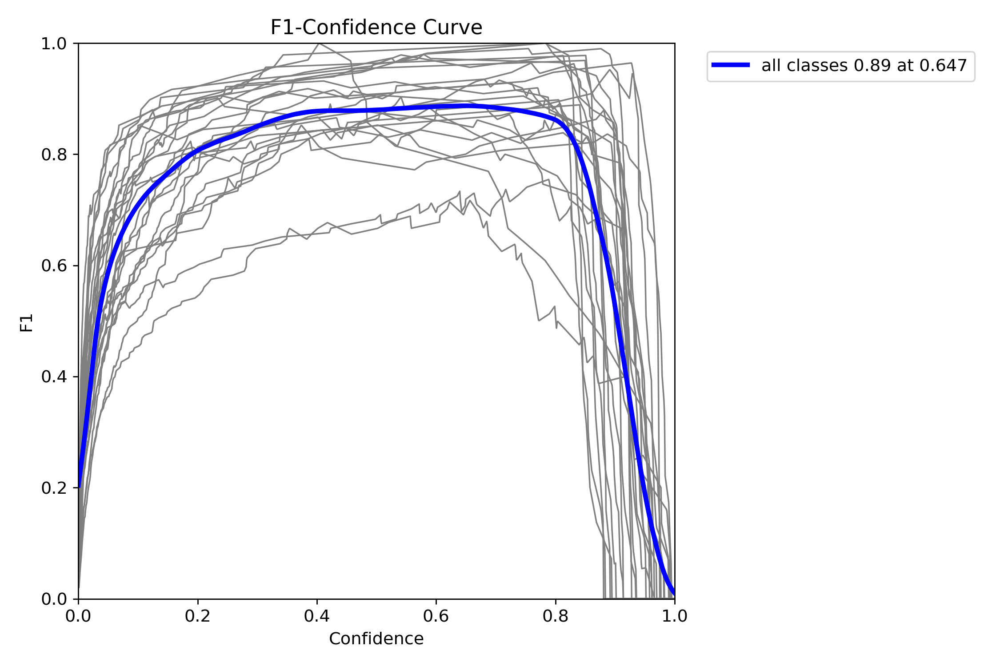

In [49]:
Image(filename='/content/runs/detect/yolov8s_road_sign_experiment/F1_curve.png', width=1000)

## YOLOv8m default

In [50]:
from ultralytics import YOLO

# Load the YOLOv8 model with pretrained weights
model = YOLO('yolov8m.pt')  # 'yolov8s.pt' is the nano version, you can change to 'yolov8s.pt', 'yolov8m.pt', etc.

# Train the model on your dataset using the default parameters
results = model.train(
    data='/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/data.yaml',  # Path to your data.yaml file
    epochs=10,  # Number of training epochs
    batch=16,   # Default batch size
    imgsz=640,  # Image size
    name='yolov8m_road_sign_default'  # Name for the experiment
)

# Display results
results

100%|██████████| 49.7M/49.7M [00:00<00:00, 136MB/s]


Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8m_road_sign_default, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_tx

train: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/train/labels.cache... 5325 images, 12 backgrounds, 0 corrupt: 100%|██████████| 5325/5325 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels.cache... 623 images, 1 backgrounds, 0 corrupt: 100%|██████████| 623/623 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8m_road_sign_default/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000345, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8m_road_sign_default
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      7.18G     0.7566      2.498      1.224         13        640: 100%|██████████| 333/333 [00:51<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.72it/s]


                   all        623        801      0.744      0.728      0.794      0.638

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      7.18G     0.7151      1.026      1.172         13        640: 100%|██████████| 333/333 [00:46<00:00,  7.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.78it/s]

                   all        623        801      0.769      0.752      0.825      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      7.26G     0.6968     0.7905      1.171         16        640: 100%|██████████| 333/333 [00:45<00:00,  7.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.72it/s]

                   all        623        801      0.794      0.871      0.898      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      7.25G     0.6755     0.6395      1.147         19        640: 100%|██████████| 333/333 [00:44<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.85it/s]

                   all        623        801      0.847      0.856      0.907      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      7.17G     0.6578     0.5366      1.121         16        640: 100%|██████████| 333/333 [00:44<00:00,  7.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.90it/s]

                   all        623        801      0.903      0.898      0.937      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      7.27G     0.6222     0.4595      1.094         18        640: 100%|██████████| 333/333 [00:44<00:00,  7.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.98it/s]

                   all        623        801      0.902      0.927      0.951      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      7.28G     0.5976     0.3988      1.075         16        640: 100%|██████████| 333/333 [00:44<00:00,  7.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.98it/s]

                   all        623        801      0.887      0.936      0.953      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      7.27G     0.5732     0.3601      1.057         14        640: 100%|██████████| 333/333 [00:44<00:00,  7.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.73it/s]

                   all        623        801      0.926      0.937      0.962      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      7.18G     0.5514     0.3227      1.036         13        640: 100%|██████████| 333/333 [00:44<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  5.93it/s]

                   all        623        801      0.943      0.939      0.966      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      7.27G     0.5185     0.2895      1.018         15        640: 100%|██████████| 333/333 [00:44<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:03<00:00,  6.03it/s]

                   all        623        801      0.942      0.945      0.969      0.817



10 epochs completed in 0.141 hours.
Optimizer stripped from runs/detect/yolov8m_road_sign_default/weights/last.pt, 52.1MB
Optimizer stripped from runs/detect/yolov8m_road_sign_default/weights/best.pt, 52.1MB

Validating runs/detect/yolov8m_road_sign_default/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,854,235 parameters, 0 gradients, 78.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.60it/s]


                   all        623        801      0.944      0.946      0.969      0.816
-Road narrows on right         15         15      0.893      0.933      0.988      0.869
     Attention Please-         23         23       0.99          1      0.995      0.892
    Beware of children         23         23      0.963      0.957      0.962      0.875
CYCLE ROUTE AHEAD WARNING         29         29          1      0.964      0.974      0.876
             Crosswalk         42         43      0.877          1      0.964      0.771
Dangerous Left Curve Ahead         24         24      0.734      0.919      0.884      0.724
Dangerous Rright Curve Ahead         30         30          1      0.726      0.938      0.785
              No Entry         26         27      0.984          1      0.995      0.919
        No_Over_Taking         23         23       0.98      0.957      0.993      0.722
          One way road         27         27      0.886      0.861      0.923      0.791
      Sp

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7992098109d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,  

In [51]:
metrics = model.val()

Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25,854,235 parameters, 0 gradients, 78.8 GFLOPs


val: Scanning /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels.cache... 623 images, 1 backgrounds, 0 corrupt: 100%|██████████| 623/623 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:06<00:00,  6.25it/s]


                   all        623        801      0.944      0.947      0.969      0.816
-Road narrows on right         15         15      0.893      0.933      0.988      0.873
     Attention Please-         23         23       0.99          1      0.995      0.892
    Beware of children         23         23      0.963      0.957      0.962      0.874
CYCLE ROUTE AHEAD WARNING         29         29          1      0.964      0.974      0.876
             Crosswalk         42         43      0.877          1      0.964      0.765
Dangerous Left Curve Ahead         24         24      0.734       0.92      0.884      0.724
Dangerous Rright Curve Ahead         30         30          1      0.727      0.938      0.785
              No Entry         26         27      0.984          1      0.995      0.919
        No_Over_Taking         23         23       0.98      0.957      0.993      0.717
          One way road         27         27      0.886      0.866      0.923      0.794
      Sp

In [52]:
# Create a submission file with best predictions
predictions = model.predict(source='/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test')  # Run predictions

# Create submission file ensuring no duplicates
with open('submission_1.csv', 'w') as f:
    f.write('filename,class\n')  # CSV header

    for pred in predictions:
        image_id = pred.path.split('/')[-1]  # Extract image ID from the path

        if pred.boxes is not None and len(pred.boxes) > 0:  # Check if there are any predicted boxes
            best_box = None  # Placeholder for best box (highest confidence)
            best_confidence = -1  # Initialize with a low value

            # Loop through each prediction box to find the best (highest confidence) box
            for box in pred.boxes.data:
                confidence = box[4].item()  # Confidence score (usually stored in index 4)

                if confidence > best_confidence:
                    best_confidence = confidence
                    best_box = box

            # After identifying the best box, write its class to the submission file
            if best_box is not None:
                class_id = int(best_box[5].item())  # Class ID (usually stored in index 5)
                class_name = pred.names[class_id]  # Get class name from 'names' dictionary
                f.write(f"{image_id},{class_name}\n")

        else:
            # If no boxes were detected for this image, write a default 'No detection'
            f.write(f"{image_id},No detection\n")


image 1/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00000_png_jpg.rf.fe38518f555b8b4d139ed0a31adee9fc.jpg: 640x640 (no detections), 9.0ms
image 2/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00014_png_jpg.rf.da4d304ccb4fd7555f5c291bed572107.jpg: 640x640 1 Speed limit 20 Kph, 9.2ms
image 3/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00018_png_jpg.rf.4eff8cf87317fad6622f1d00b81d575e.jpg: 640x640 1 Speed limit 20 Kph, 9.1ms
image 4/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00019_png_jpg.rf.923c0a404dce9e2518dcff1a64cd7e04.jpg: 640x640 1 Speed limit 20 Kph, 10.5ms
image 5/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00021_png_jpg.rf.f0f74c580fb71be6df258535e2d301af.jpg: 640x640 1 Speed limit 20 Kph, 10.0ms
image 6/308 /content/drive/Shareddrives/Lab1_Ka

In [53]:
import os
from ultralytics import YOLO
from pathlib import Path
import glob

# Load your trained model
model = YOLO('/content/runs/detect/yolov8m_road_sign_default/weights/best.pt')

# Specify the source of the validation images and labels
source_path = '/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test'
ground_truth_path = '/content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/valid/labels'

# Specify the directory where you want to save the predictions
save_directory = '/content/runs/detect/predictions_8m_labels_test'  # Folder for saving labels
os.makedirs(save_directory, exist_ok=True)  # Create the directory if it doesn't exist

# Predict and get the results
predictions = model.predict(source=source_path, save=True)

# Function to calculate IoU
def calculate_iou(box1, box2):
    """Calculates IoU for two bounding boxes in (x1, y1, x2, y2) format."""
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Compute the area of intersection
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)

    # Compute the area of both the prediction and ground-truth rectangles
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the union area
    union_area = box1_area + box2_area - inter_area

    # Compute IoU
    iou = inter_area / union_area if union_area > 0 else 0
    return iou

def convert_yolo_to_xyxy(bbox, img_width, img_height):
    """Converts YOLO format (x_center, y_center, width, height) to (x1, y1, x2, y2)."""
    x_center, y_center, width, height = bbox
    x1 = (x_center - width / 2) * img_width
    y1 = (y_center - height / 2) * img_height
    x2 = (x_center + width / 2) * img_width
    y2 = (y_center + height / 2) * img_height
    return [x1, y1, x2, y2]

def load_ground_truth(ground_truth_path, image_name_base, img_width, img_height):
    """Loads ground truth bounding boxes from YOLO format and converts them to (x1, y1, x2, y2)."""
    gt_boxes = []

    # Match ground truth file using only the base part of the image name
    gt_pattern = os.path.join(ground_truth_path, f"{image_name_base}*.txt")
    matching_files = glob.glob(gt_pattern)

    if len(matching_files) == 0:
        print(f"No ground truth file found for {image_name_base}")
        return gt_boxes  # Return empty if no matching file is found

    gt_file = matching_files[0]  # Take the first match

    # Load ground truth boxes from the file
    with open(gt_file, 'r') as f:
        for line in f.readlines():
            label_data = line.split()
            bbox = [float(x) for x in label_data[1:5]]  # Assuming format: class x_center y_center width height
            gt_boxes.append(convert_yolo_to_xyxy(bbox, img_width, img_height))  # Convert to x1, y1, x2, y2

    return gt_boxes

# List to store IoU values
iou_list = []

# Save predictions and calculate IoU
for i, pred in enumerate(predictions):
    image_name = os.path.basename(pred.path)  # Get the image name
    label_file = os.path.join(save_directory, f"{image_name.split('.')[0]}.txt")  # Label file path

    pred_boxes = []  # To store predicted boxes for IoU calculation

    with open(label_file, 'w') as f:
        # Loop through each prediction box and save the label in YOLO format
        if pred.boxes is not None and len(pred.boxes) > 0:
            for box in pred.boxes.data:
                class_id = int(box[5].item())  # Class ID (usually stored in index 5)
                x_center = (box[0] + box[2]) / 2  # x_center (YOLO format)
                y_center = (box[1] + box[3]) / 2  # y_center (YOLO format)
                width = box[2] - box[0]  # width (YOLO format)
                height = box[3] - box[1]  # height (YOLO format)
                confidence = box[4].item()  # Confidence score

                # Store the predicted box in (x1, y1, x2, y2) format for IoU calculation
                pred_boxes.append([box[0].item(), box[1].item(), box[2].item(), box[3].item()])

                # Write the YOLO format label to the file (class_id x_center y_center width height confidence)
                f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f} {confidence:.6f}\n")
        else:
            f.write(f"No detections for {image_name}\n")


    image_name_base = image_name.split('.')[0]  # Extract base part of the image name
    gt_boxes = load_ground_truth(ground_truth_path, image_name_base, 640, 640)  # Pass all required arguments

    # Calculate IoU for each predicted box against the ground truth boxes
    if pred_boxes and gt_boxes:
        for pred_box in pred_boxes:
            best_iou = 0  # To store the best IoU for each predicted box
            for gt_box in gt_boxes:
                iou = calculate_iou(pred_box, gt_box)  # Compare only the box coordinates (x1, y1, x2, y2)
                if iou > best_iou:
                    best_iou = iou  # Store the best IoU for this predicted box
            print(f"IoU for {image_name}: {best_iou:.4f}")
            iou_list.append(best_iou)  # Append IoU to the list
    else:
        print(f"No predictions or ground truths available for {image_name}")

# Calculate and print the average IoU
if iou_list:
    avg_iou = sum(iou_list) / len(iou_list)
    print(f"Average IoU: {avg_iou:.4f}")
else:
    print("No IoU values calculated.")

print(f"Labels saved in {save_directory}")


image 1/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00000_png_jpg.rf.fe38518f555b8b4d139ed0a31adee9fc.jpg: 640x640 (no detections), 10.9ms
image 2/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00014_png_jpg.rf.da4d304ccb4fd7555f5c291bed572107.jpg: 640x640 1 Speed limit 20 Kph, 10.6ms
image 3/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00018_png_jpg.rf.4eff8cf87317fad6622f1d00b81d575e.jpg: 640x640 1 Speed limit 20 Kph, 9.5ms
image 4/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00019_png_jpg.rf.923c0a404dce9e2518dcff1a64cd7e04.jpg: 640x640 1 Speed limit 20 Kph, 9.8ms
image 5/308 /content/drive/Shareddrives/Lab1_KaggleDatasets/Road_Sign_Detection  3/test/00000_00000_00021_png_jpg.rf.f0f74c580fb71be6df258535e2d301af.jpg: 640x640 1 Speed limit 20 Kph, 9.7ms
image 6/308 /content/drive/Shareddrives/Lab1_Ka

In [54]:
from IPython.display import display, Image

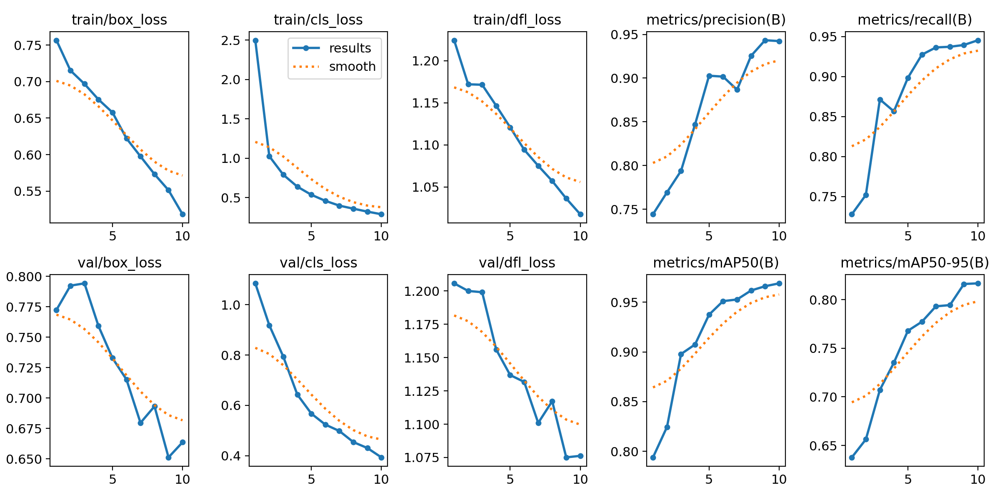

In [55]:
Image(filename='/content/runs/detect/yolov8m_road_sign_default/results.png', width=1000)

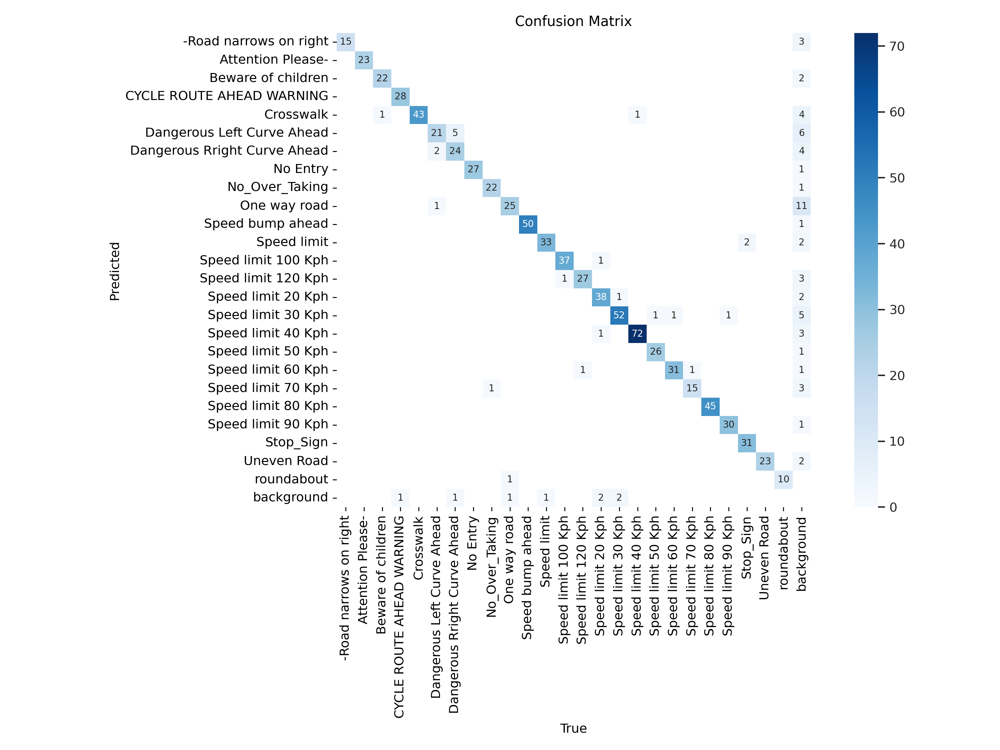

In [56]:
Image(filename='/content/runs/detect/yolov8m_road_sign_default/confusion_matrix.png', width=1000)

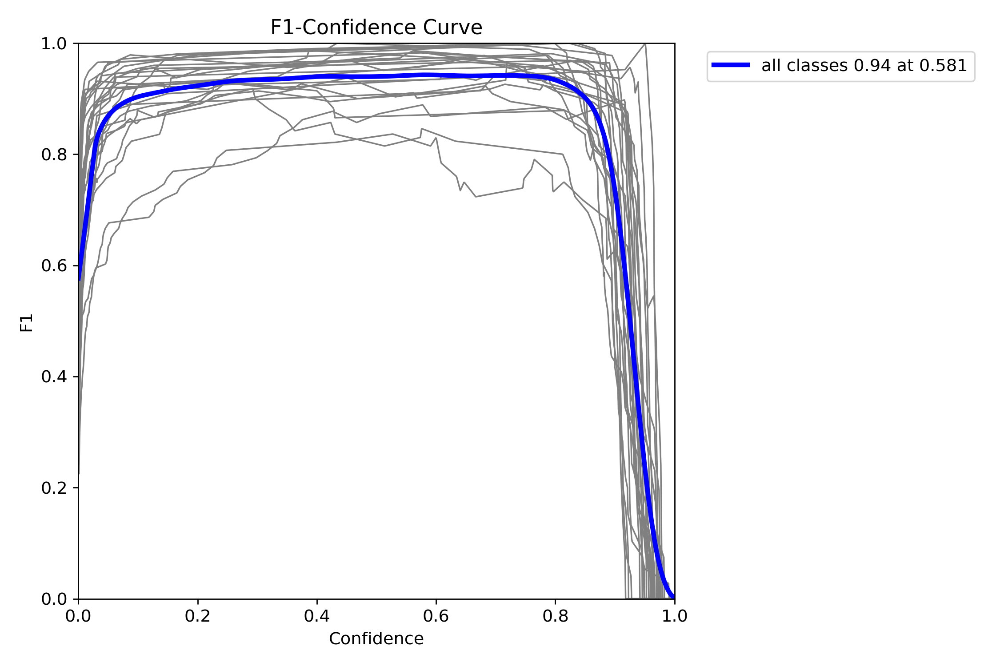

In [57]:
Image(filename='/content/runs/detect/yolov8m_road_sign_default/F1_curve.png', width=1000)

In [58]:
import shutil
from google.colab import files

# Zip the entire 'runs' folder
shutil.make_archive('runs_backup_8s_full', 'zip', 'runs')

# Download the zipped file
files.download('runs_backup_8s_full.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>